In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
datos = "/content/drive/MyDrive/premier-player-23-24.csv"


In [ ]:
datos_df = pd.read_csv(datos)
datos_df.head()

,Player,Nation,Pos,Pos2,Age,MP,Starts,Min,90s,Gls,...,Ast_90,G+A_90,G-PK_90,G+A-PK_90,xG_90,xAG_90,xG+xAG_90,npxG_90,npxG+xAG_90,Team
0,Rodri,ESP,MF,NaN,27,34,34,2931,32.6,8,...,0.28,0.52,0.25,0.52,0.12,0.12,0.24,0.12,0.24,Manchester City
1,Phil Foden,ENG,FW,MF,23,35,33,2857,31.7,19,...,0.25,0.85,0.60,0.85,0.33,0.26,0.59,0.33,0.59,Manchester City
2,Ederson,BRA,GK,NaN,29,33,33,2785,30.9,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Manchester City
3,Julián Álvarez,ARG,MF,FW,23,36,31,2647,29.4,11,...,0.27,0.65,0.31,0.58,0.44,0.22,0.66,0.39,0.61,Manchester City
4,Kyle Walker,ENG,DF,NaN,33,32,30,2767,30.7,0,...,0.13,0.13,0.00,0.13,0.01,0.09,0.10,0.01,0.10,Manchester City


In [ ]:
datos_df.describe()

,Age,MP,Starts,Min,90s,Gls,Ast,G+A,G-PK,PK,...,Gls_90,Ast_90,G+A_90,G-PK_90,G+A-PK_90,xG_90,xAG_90,xG+xAG_90,npxG_90,npxG+xAG_90
count,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,...,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000
mean,24.906897,19.627586,14.413793,1294.584483,14.383448,2.063793,1.481034,3.544828,1.898276,0.165517,...,0.125259,0.091621,0.216810,0.118155,0.209638,0.144983,0.100707,0.245845,0.138431,0.239466
std,4.464593,11.832419,11.926422,1024.720358,11.385342,3.621238,2.360729,5.391389,3.189739,0.779830,...,0.223161,0.160703,0.297085,0.214342,0.287035,0.222225,0.210713,0.348004,0.213947,0.340631
min,15.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,9.000000,3.000000,342.750000,3.775000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.017500,0.010000,0.060000,0.017500,0.060000
50%,25.000000,20.000000,13.000000,1164.000000,12.950000,1.000000,0.000000,1.000000,1.000000,0.000000,...,0.030000,0.000000,0.100000,0.030000,0.100000,0.070000,0.060000,0.145000,0.070000,0.145000
75%,28.000000,30.000000,25.000000,2104.250000,23.400000,2.000000,2.000000,4.000000,2.000000,0.000000,...,0.170000,0.130000,0.310000,0.160000,0.300000,0.190000,0.140000,0.370000,0.180000,0.350000
max,38.000000,38.000000,38.000000,3420.000000,38.000000,27.000000,13.000000,33.000000,20.000000,9.000000,...,2.650000,1.700000,2.650000,2.650000,2.650000,3.230000,4.440000,5.540000,3.230000,5.540000


In [ ]:
def estadisticas_descriptivas_univariadas(columna):
  estadistica={
      'Media' : [columna.mean()],
      'Mediana': [columna.median()],
      'Desviacion Estandar': [columna.std()],
      'Valor Minimo': [columna.min()],
      'Valor Maximo': [columna.max()],
      "Moda": [columna.mode()[0]],
      "Varianza": [columna.var()],
      "Rango": [columna.max() - columna.min()],
      "Coeficiente de variacion": [columna.std() / columna.mean()],
      "Rango intercuartilico": [columna.quantile(0.75) - columna.quantile(0.25)],
      "% de nulos" : [(columna.isnull().sum() / len(columna)) * 100],
      "Numero de datos" : [columna.count()]

  }
  return pd.DataFrame(estadistica)

In [ ]:
lista1=[]
for column in datos_df:
        lista1.append(column)
print(lista1)

['Player', 'Nation', 'Pos', 'Pos2', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls', 'Ast', 'G+A', 'G-PK', 'PK', 'PKatt', 'CrdY', 'CrdR', 'xG', 'npxG', 'xAG', 'npxG+xAG', 'PrgC', 'PrgP', 'PrgR', 'Gls_90', 'Ast_90', 'G+A_90', 'G-PK_90', 'G+A-PK_90', 'xG_90', 'xAG_90', 'xG+xAG_90', 'npxG_90', 'npxG+xAG_90', 'Team']


In [ ]:
filtered_list = [item for item in lista1 if item not in {'Player','Nation','Team'}]
print(filtered_list)

['Pos', 'Pos2', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls', 'Ast', 'G+A', 'G-PK', 'PK', 'PKatt', 'CrdY', 'CrdR', 'xG', 'npxG', 'xAG', 'npxG+xAG', 'PrgC', 'PrgP', 'PrgR', 'Gls_90', 'Ast_90', 'G+A_90', 'G-PK_90', 'G+A-PK_90', 'xG_90', 'xAG_90', 'xG+xAG_90', 'npxG_90', 'npxG+xAG_90']


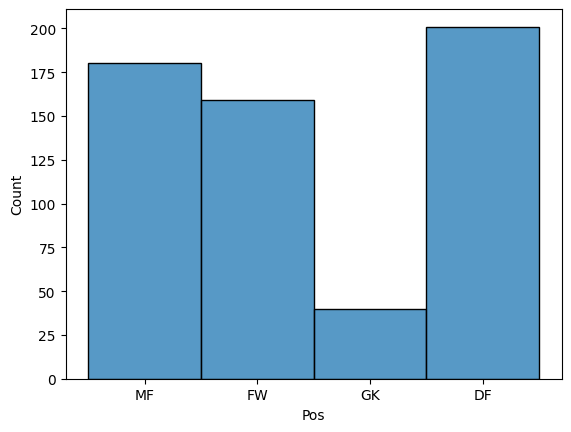

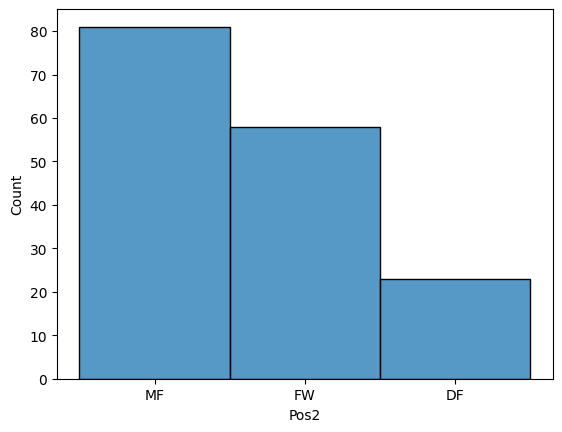

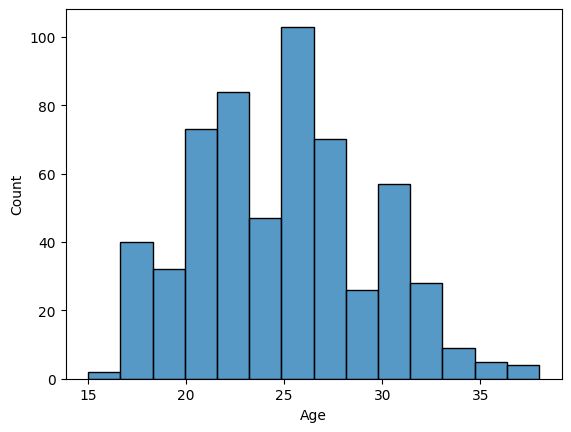

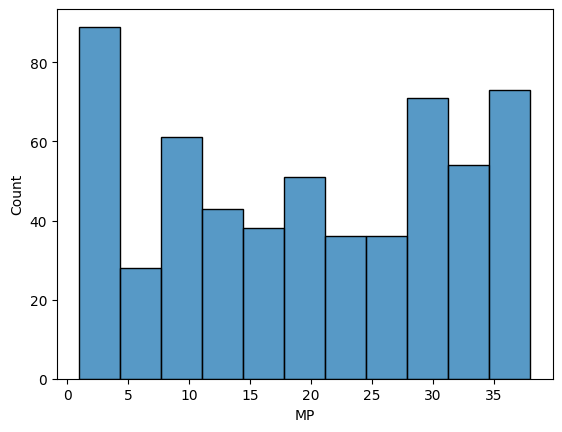

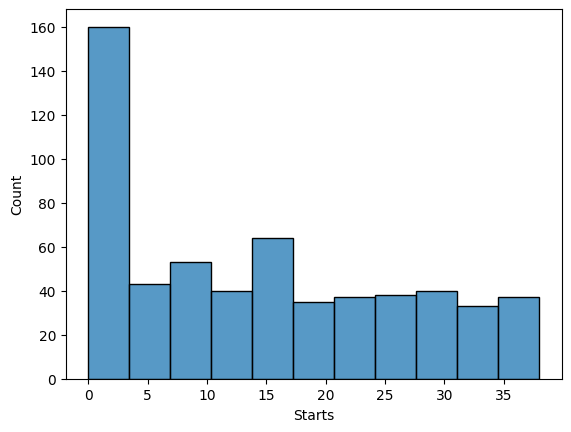

...

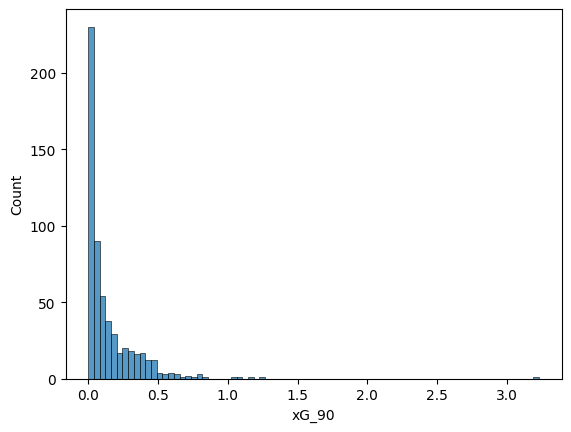

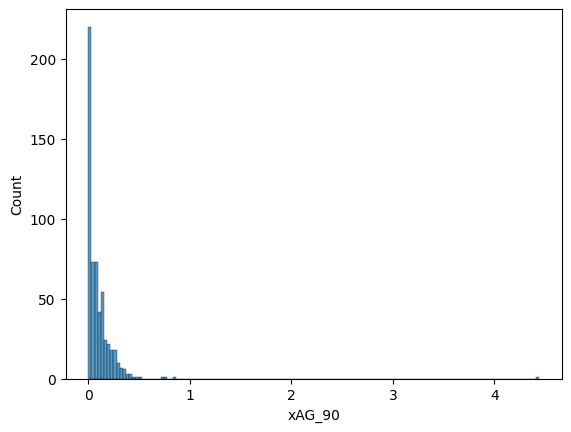

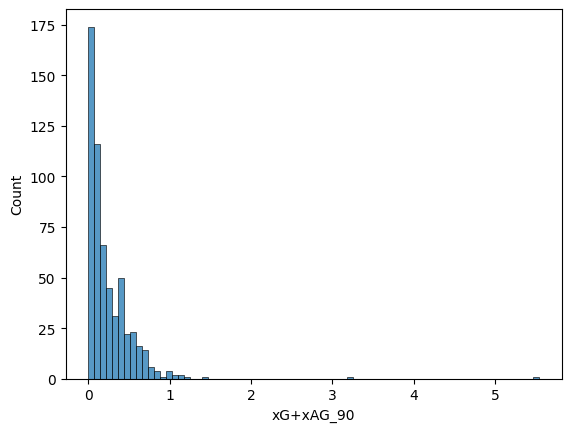

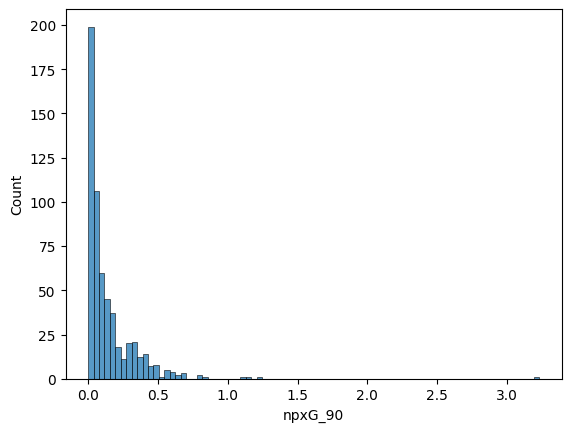

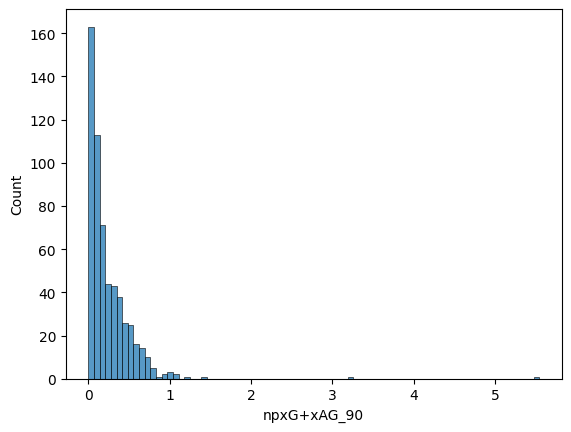

In [ ]:
for i in filtered_list:
  sns.histplot(datos_df[i])
  plt.show()

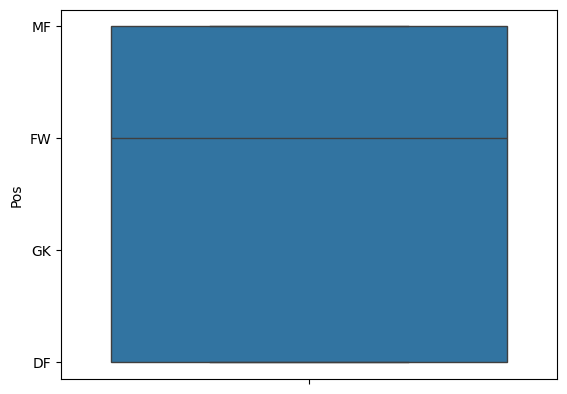

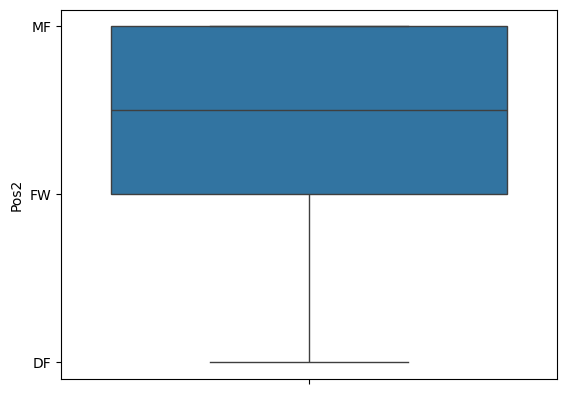

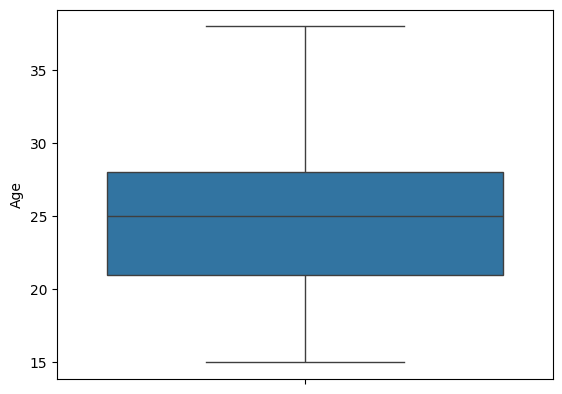

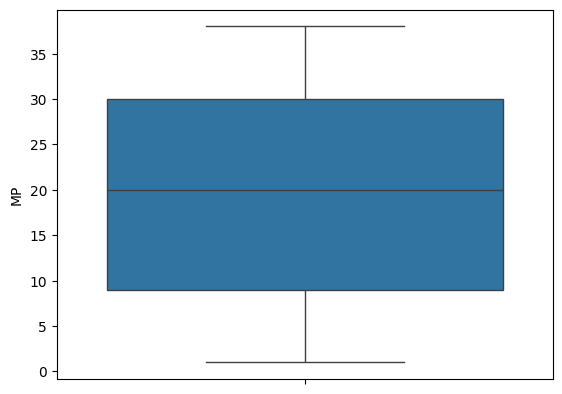

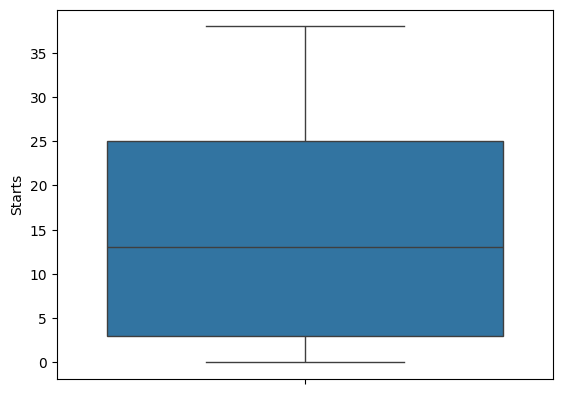

...

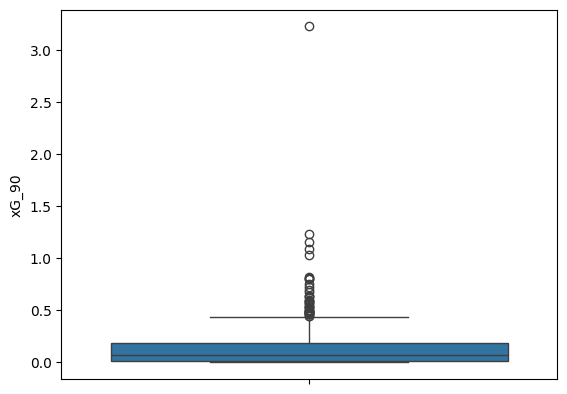

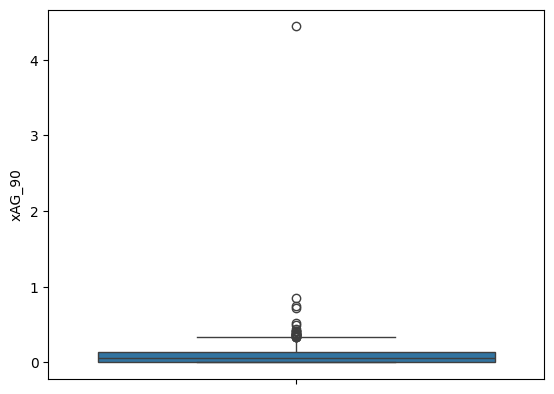

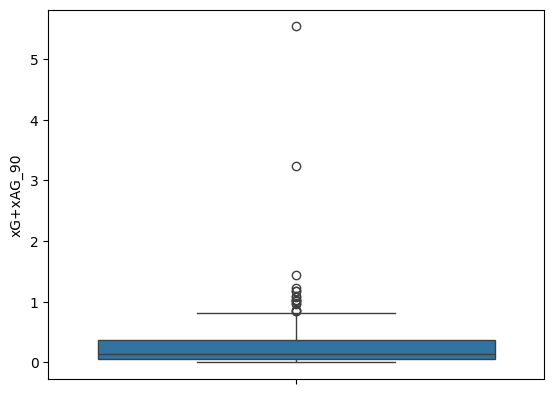

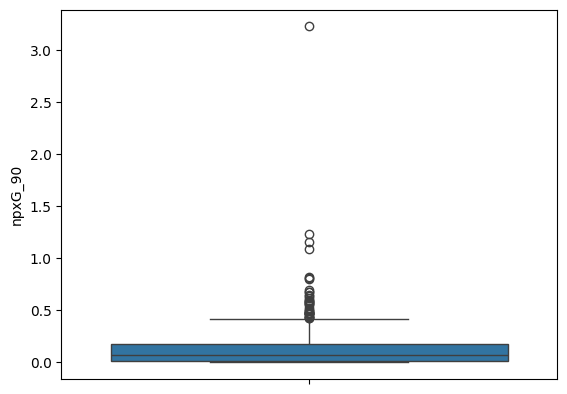

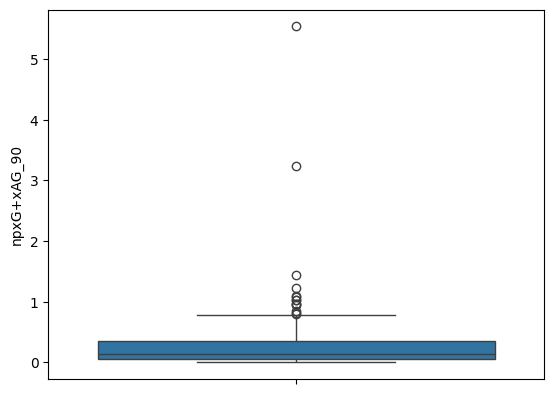

In [ ]:
for i in filtered_list:
  sns.boxplot(datos_df[i])
  plt.show()

In [ ]:
def valor_atipico_z_score(x,media,std):
  if x < media-2*std :
    'atipico'
  elif x > media+2*std:
    'atipico'
  else:
    'no atipico'

In [ ]:
valor_atipico_z_score(datos_df, datos_df.mean(), datos_df.std)

TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [ ]:
lista_med = []
def valorabs(x):
  lista_mas = lista_med.append(abs((x - media))/meda)
  return lista_med
def med(lista):
  med = np.median(lista)
  return med
  def z_score_modificda(x, mediana, med):
    x = (x - mediana) / med
    return x


In [ ]:
#Obtener las columnas con únicamente valores númericos
Lista_sinstr=[]
for i in datos_df:
  try:                               #usamos el try por si no es posible convertir a float el primer valor
    valor=float(datos_df[i][0])
    if pd.notnull(datos_df[i][0]):   #verificamos que el primer dato sea no nulo (NaN) puesto que NaN es un float en sí
      Lista_sinstr.append(i)         #añadimos el nombre de la columna cuyo primer elemento es un valor numérico
  except ValueError:
    pass                             #si tenemos un ValueError al intentar convertir una cadena a float simplemente pasamos
print(Lista_sinstr)

['Age', 'MP', 'Starts', 'Min', '90s', 'Gls', 'Ast', 'G+A', 'G-PK', 'PK', 'PKatt', 'CrdY', 'CrdR', 'xG', 'npxG', 'xAG', 'npxG+xAG', 'PrgC', 'PrgP', 'PrgR', 'Gls_90', 'Ast_90', 'G+A_90', 'G-PK_90', 'G+A-PK_90', 'xG_90', 'xAG_90', 'xG+xAG_90', 'npxG_90', 'npxG+xAG_90']


In [ ]:
#Z-score modificado para distribuciones no gaussianas PARA UNA COLUMNA ESPECÍFICA
def z_modificado(columna):
  valores_atipicos=[]
  meda=0
  for x in datos_df[columna]:
    meda+=abs(x-datos_df[columna].mean())
  meda=meda/len(datos_df[columna])
  for x in datos_df[columna]:
    criterio=abs(x-datos_df[columna].mean())/meda
    if criterio>4:
      valores_atipicos.append(x)
  return valores_atipicos                          #devuelve una lista con los avlores atípicos del objeto

In [ ]:
#En todas las columnas cuyos datos sean datos numéricos aplicaremos el criterio de z-modificado y almacenaremos en listas los valores atípicos junto al nombre del objeto
Lista_atipicos=[]
for nombre in Lista_sinstr:
  if z_modificado(nombre)!=[]:
    Lista_atipicos.append(nombre)
for i,nombre in enumerate(Lista_atipicos):
  Lista_atipicos[i]=[nombre,z_modificado(nombre)]
print(Lista_atipicos)


[['Gls', [19, 27, 18, 16, 13, 12, 14, 22, 21, 17, 19, 16, 16, 19, 12, 12, 12, 14]], ['Ast', [9, 9, 10, 10, 10, 9, 11, 10, 10, 10, 9, 10, 13, 9, 10, 9, 10, 9]], ['G+A', [27, 19, 32, 28, 19, 25, 20, 19, 33, 21, 23, 27, 32, 19, 22, 21, 22, 19]], ['G-PK', [19, 20, 13, 11, 12, 12, 14, 13, 16, 15, 11, 19, 16, 14, 17, 11, 11, 12, 14]], ['PK', [2, 7, 5, 2, 6, 9, 5, 2, 2, 4, 2, 4, 2, 2, 2, 2, 2, 4, 2, 2, 3, 5, 2]], ['PKatt', [2, 8, 7, 2, 6, 9, 2, 6, 2, 2, 5, 2, 4, 2, 2, 2, 2, 2, 5, 3, 2, 3, 5, 2]], ['CrdY', [13, 13]], ['CrdR', [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1]], ['xG', [13.0, 29.2, 11.9, 21.2, 16.3, 15.5, 12.3, 18.6, 18.2, 20.3, 12.0, 16.8, 11.6, 12.9, 11.9, 19.6, 11.9, 11.4]], ['npxG', [10.3, 11.5, 22.9, 11.9, 15.5, 15.5, 10.8, 11.6, 18.6, 11.1, 15.6, 10.4, 10.3, 16.8, 11.6, 11.4, 17.2, 10.6, 11.9]], ['xAG', [8.4, 7.6, 11.5, 11.8, 9.6, 10.5, 11.1, 8.0, 7.5, 11.8, 

In [ ]:
def meda(x,media):
    [columna.median(x-media)],

In [ ]:
def valor_atipico_z_modificado():
      abs((x-media))/meda

In [ ]:
Lista_sinstr

['Age',
 'MP',
 'Starts',
 'Min',
 '90s',
 'Gls',
 'Ast',
 'G+A',
 'G-PK',
 'PK',
 'PKatt',
 'CrdY',
 'CrdR',
 'xG',
 'npxG',
 'xAG',
 'npxG+xAG',
 'PrgC',
 'PrgP',
 'PrgR',
 'Gls_90',
 'Ast_90',
 'G+A_90',
 'G-PK_90',
 'G+A-PK_90',
 'xG_90',
 'xAG_90',
 'xG+xAG_90',
 'npxG_90',
 'npxG+xAG_90']

In [ ]:
for i in Lista_sinstr:
  datos_df[i] = datos_df[i].astype(float)

In [ ]:
datos_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 580 entries, 0 to 579
Data columns (total 35 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Player       580 non-null    object 
 1   Nation       580 non-null    object 
 2   Pos          580 non-null    object 
 3   Pos2         162 non-null    object 
 4   Age          580 non-null    float64
 5   MP           580 non-null    float64
 6   Starts       580 non-null    float64
 7   Min          580 non-null    float64
 8   90s          580 non-null    float64
 9   Gls          580 non-null    float64
 10  Ast          580 non-null    float64
 11  G+A          580 non-null    float64
 12  G-PK         580 non-null    float64
 13  PK           580 non-null    float64
 14  PKatt        580 non-null    float64
 15  CrdY         580 non-null    float64
 16  CrdR         580 non-null    float64
 17  xG           580 non-null    float64
 18  npxG         580 non-null    float64
 19  xAG     

In [ ]:
lista_numeros = [item for item in lista1 if item not in {'Player','Nation','Team', "Pos", "Pos2"}]
lista_numeros

['Age',
 'MP',
 'Starts',
 'Min',
 '90s',
 'Gls',
 'Ast',
 'G+A',
 'G-PK',
 'PK',
 'PKatt',
 'CrdY',
 'CrdR',
 'xG',
 'npxG',
 'xAG',
 'npxG+xAG',
 'PrgC',
 'PrgP',
 'PrgR',
 'Gls_90',
 'Ast_90',
 'G+A_90',
 'G-PK_90',
 'G+A-PK_90',
 'xG_90',
 'xAG_90',
 'xG+xAG_90',
 'npxG_90',
 'npxG+xAG_90']

In [ ]:
lista1

['Player',
 'Nation',
 'Pos',
 'Pos2',
 'Age',
 'MP',
 'Starts',
 'Min',
 '90s',
 'Gls',
 'Ast',
 'G+A',
 'G-PK',
 'PK',
 'PKatt',
 'CrdY',
 'CrdR',
 'xG',
 'npxG',
 'xAG',
 'npxG+xAG',
 'PrgC',
 'PrgP',
 'PrgR',
 'Gls_90',
 'Ast_90',
 'G+A_90',
 'G-PK_90',
 'G+A-PK_90',
 'xG_90',
 'xAG_90',
 'xG+xAG_90',
 'npxG_90',
 'npxG+xAG_90',
 'Team']

In [ ]:
for i in lista1:
  if i not in lista_numeros:
    datos_df = datos_df.drop(columns=i)
  else:
    pass

In [ ]:
datos_df

,Age,MP,Starts,Min,90s,Gls,Ast,G+A,G-PK,PK,...,Gls_90,Ast_90,G+A_90,G-PK_90,G+A-PK_90,xG_90,xAG_90,xG+xAG_90,npxG_90,npxG+xAG_90
0,27.0,34.0,34.0,2931.0,32.6,8.0,9.0,17.0,8.0,0.0,...,0.25,0.28,0.52,0.25,0.52,0.12,0.12,0.24,0.12,0.24
1,23.0,35.0,33.0,2857.0,31.7,19.0,8.0,27.0,19.0,0.0,...,0.60,0.25,0.85,0.60,0.85,0.33,0.26,0.59,0.33,0.59
2,29.0,33.0,33.0,2785.0,30.9,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,23.0,36.0,31.0,2647.0,29.4,11.0,8.0,19.0,9.0,2.0,...,0.37,0.27,0.65,0.31,0.58,0.44,0.22,0.66,0.39,0.61
4,33.0,32.0,30.0,2767.0,30.7,0.0,4.0,4.0,0.0,0.0,...,0.00,0.13,0.13,0.00,0.13,0.01,0.09,0.10,0.01,0.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,17.0,1.0,0.0,28.0,0.3,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
576,19.0,1.0,0.0,21.0,0.2,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
577,19.0,2.0,0.0,13.0,0.1,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
578,18.0,1.0,0.0,10.0,0.1,0.0,0.0,0.0,0.0,0.0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [ ]:
datos_df.corr()

,Age,MP,Starts,Min,90s,Gls,Ast,G+A,G-PK,PK,...,Gls_90,Ast_90,G+A_90,G-PK_90,G+A-PK_90,xG_90,xAG_90,xG+xAG_90,npxG_90,npxG+xAG_90
Age,1.000000,0.237615,0.244288,0.246633,0.246552,0.031775,0.066362,0.050401,0.034747,0.005426,...,-0.018819,0.009166,-0.009678,-0.021801,-0.011307,-0.034957,0.033208,-0.001795,-0.038196,-0.003133
MP,0.237615,1.000000,0.911365,0.926703,0.926661,0.498480,0.525861,0.565073,0.513208,0.215579,...,0.199406,0.153619,0.233094,0.181526,0.221581,0.085668,0.061675,0.091228,0.065333,0.078711
Starts,0.244288,0.911365,1.000000,0.995239,0.995232,0.465914,0.517708,0.539630,0.472724,0.229947,...,0.100497,0.089898,0.124454,0.079455,0.109761,-0.006605,0.019635,0.007048,-0.028871,-0.006305
Min,0.246633,0.926703,0.995239,1.000000,0.999997,0.463520,0.514526,0.536629,0.470014,0.229915,...,0.104069,0.090750,0.127537,0.082945,0.112812,-0.003676,0.018747,0.008270,-0.026324,-0.005379
90s,0.246552,0.926661,0.995232,0.999997,1.000000,0.463522,0.514434,0.536589,0.469994,0.230004,...,0.104132,0.090722,0.127569,0.082999,0.112837,-0.003843,0.018637,0.008097,-0.026509,-0.005564
Gls,0.031775,0.498480,0.465914,0.463520,0.463522,1.000000,0.607144,0.937521,0.981735,0.628033,...,0.617685,0.252979,0.601396,0.560798,0.559935,0.464837,0.168206,0.398164,0.408638,0.360949
Ast,0.066362,0.525861,0.517708,0.514526,0.514434,0.607144,1.000000,0.845671,0.594362,0.388228,...,0.284965,0.574655,0.525594,0.248193,0.507703,0.221661,0.281591,0.311515,0.187041,0.291732
G+A,0.050401,0.565073,0.539630,0.536629,0.536589,0.937521,0.845671,1.000000,0.919657,0.591825,...,0.539659,0.421543,0.634082,0.485348,0.598400,0.409277,0.236280,0.403838,0.356370,0.370179
G-PK,0.034747,0.513208,0.472724,0.470014,0.469994,0.981735,0.594362,0.919657,1.000000,0.468510,...,0.618688,0.247462,0.599412,0.583695,0.574195,0.449454,0.161970,0.384549,0.411402,0.358686
PK,0.005426,0.215579,0.229947,0.229915,0.230004,0.628033,0.388228,0.591825,0.468510,1.000000,...,0.337679,0.162545,0.340884,0.216647,0.251497,0.320130,0.118583,0.276004,0.214805,0.208978


In [ ]:
corr_matriz = datos_df.corr()
# Crear el mapa de calor
plt.figure(figsize=(9, 7))  # Tamaño de la figura
sns.heatmap(corr_matriz, annot=False, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Mapa de calor de la matriz de correlación")
plt.show()

In [ ]:
datos_df.cov()

,Age,MP,Starts,Min,90s,Gls,Ast,G+A,G-PK,PK,...,Gls_90,Ast_90,G+A_90,G-PK_90,G+A-PK_90,xG_90,xAG_90,xG+xAG_90,npxG_90,npxG+xAG_90
Age,19.932595,12.552486,13.007504,1.128338e+03,12.532480,0.513722,0.699440,1.213162,0.494831,0.018891,...,-0.018750,0.006576,-0.012836,-0.020863,-0.014490,-0.034682,0.031240,-0.002788,-0.036485,-0.004765
MP,12.552486,140.006146,128.610327,1.123620e+04,124.836140,21.358859,14.688952,36.047811,19.369650,1.989209,...,0.526539,0.292107,0.819380,0.460383,0.752559,0.225261,0.153770,0.375652,0.165391,0.317244
Starts,13.007504,128.610327,142.239533,1.216306e+04,135.138985,20.122089,14.576082,34.698172,17.983444,2.138646,...,0.267475,0.172299,0.440959,0.203114,0.375746,-0.017506,0.049344,0.029253,-0.073667,-0.025616
Min,1128.337758,11236.199047,12163.056518,1.050052e+06,11666.755632,1720.011009,1244.682089,2964.693097,1536.284084,183.726925,...,23.798165,14.944250,38.825978,18.218092,33.181542,-0.837011,4.047876,2.949220,-5.771240,-1.877425
90s,12.532480,124.836140,135.138985,1.166676e+04,129.626012,19.110557,13.826801,32.937358,17.068434,2.042123,...,0.264574,0.165991,0.431491,0.202548,0.368750,-0.009722,0.044711,0.032080,-0.064574,-0.021577
Gls,0.513722,21.358859,20.122089,1.720011e+03,19.110557,13.113367,5.190331,18.303698,11.339834,1.773533,...,0.499163,0.147219,0.646991,0.435282,0.582009,0.374068,0.128349,0.501768,0.316594,0.445233
Ast,0.699440,14.688952,14.576082,1.244682e+03,13.826801,5.190331,5.573042,10.763373,4.475615,0.714716,...,0.150126,0.218010,0.368618,0.125587,0.344026,0.116286,0.140074,0.255923,0.094469,0.234593
G+A,1.213162,36.047811,34.698172,2.964693e+03,32.937358,18.303698,10.763373,29.067072,15.815449,2.488250,...,0.649289,0.365229,1.015610,0.560869,0.926035,0.490355,0.268422,0.757691,0.411064,0.679825
G-PK,0.494831,19.369650,17.983444,1.536284e+03,17.068434,11.339834,4.475615,15.815449,10.174436,1.165398,...,0.440398,0.126849,0.568017,0.399069,0.525714,0.318591,0.108863,0.426865,0.280755,0.389721
PK,0.018891,1.989209,2.138646,1.837269e+02,2.042123,1.773533,0.714716,2.488250,1.165398,0.608135,...,0.058765,0.020370,0.078974,0.036213,0.056295,0.055478,0.019486,0.074903,0.035839,0.055512


In [ ]:
sns.pairplot(datos_df)

In [ ]:
for i in lista_numeros:
  x = datos_df.drop(columns=i)
  y = datos_df[i]
  x = sm.add_constant(x)
  model = sm.OLS(y, x).fit()
  # print(model.rsquared)
  r_cuadrada = {i:model.rsquared}
  print(r_cuadrada)
  #print(model.summary())

{'Age': 0.12346762451471138}
{'MP': 0.9070646940495077}
{'Starts': 0.9923771123640385}
{'Min': 0.999994084304803}
{'90s': 0.9999940638209944}
{'Gls': 1.0}
{'Ast': 1.0}
{'G+A': 1.0}
{'G-PK': 1.0}
{'PK': 1.0}
{'PKatt': 0.9995405025054113}
{'CrdY': 0.5409423977319268}
{'CrdR': 0.1307344732647383}
{'xG': 0.9999776480637136}
{'npxG': 0.9999738386718048}
{'xAG': 0.9996490086582825}
{'npxG+xAG': 0.9999266909449026}
{'PrgC': 0.8612047174167893}
{'PrgP': 0.7167864852952919}
{'PrgR': 0.9088764932800426}
{'Gls_90': 0.9999681825406695}
{'Ast_90': 0.9996297992378088}
{'G+A_90': 0.999981488244314}
{'G-PK_90': 0.9999649391509987}
{'G+A-PK_90': 0.9999800739420974}
{'xG_90': 0.999948582413282}
{'xAG_90': 0.9996430698220719}
{'xG+xAG_90': 0.9999837035289078}
{'npxG_90': 0.9999462418455124}
{'npxG+xAG_90': 0.9999833233845462}


In [ ]:
for j in lista_numeros:
  variable_a_comparar = j
  contador = 0
  correlacion = []
  for i in lista_numeros:
    if i != variable_a_comparar:
      k = datos_df[i].corr(datos_df[variable_a_comparar])
      if abs(k) > 0.87:
        contador += 1
        correlacion.append(i)
  print(variable_a_comparar)
  print(contador)
  print(correlacion)

Age
0
[]
MP
3
['Starts', 'Min', '90s']
Starts
3
['MP', 'Min', '90s']
Min
3
['MP', 'Starts', '90s']
90s
3
['MP', 'Starts', 'Min']
Gls
5
['G+A', 'G-PK', 'xG', 'npxG', 'npxG+xAG']
Ast
1
['xAG']
G+A
5
['Gls', 'G-PK', 'xG', 'npxG', 'npxG+xAG']
G-PK
5
['Gls', 'G+A', 'xG', 'npxG', 'npxG+xAG']
PK
1
['PKatt']
PKatt
1
['PK']
CrdY
0
[]
CrdR
0
[]
xG
5
['Gls', 'G+A', 'G-PK', 'npxG', 'npxG+xAG']
npxG
5
['Gls', 'G+A', 'G-PK', 'xG', 'npxG+xAG']
xAG
2
['Ast', 'npxG+xAG']
npxG+xAG
6
['Gls', 'G+A', 'G-PK', 'xG', 'npxG', 'xAG']
PrgC
1
['PrgR']
PrgP
0
[]
PrgR
1
['PrgC']
Gls_90
1
['G-PK_90']
Ast_90
0
[]
G+A_90
1
['G+A-PK_90']
G-PK_90
1
['Gls_90']
G+A-PK_90
1
['G+A_90']
xG_90
1
['npxG_90']
xAG_90
0
[]
xG+xAG_90
1
['npxG+xAG_90']
npxG_90
1
['xG_90']
npxG+xAG_90
1
['xG+xAG_90']


In [ ]:
datos_df.drop(columns=['npxG+xAG', 'Starts', 'Min', '90s', 'G+A', 'G-PK', 'xG', 'npxG', 'PKatt', 'xAG', 'PrgR', 'G-PK_90', 'G+A-PK_90', 'npxG_90', 'npxG+xAG_90'], inplace = True)
a = ['npxG+xAG', 'Starts', 'Min', '90s', 'G+A', 'G-PK', 'xG', 'npxG', 'PKatt', 'xAG', 'PrgR', 'G-PK_90', 'G+A-PK_90', 'npxG_90', 'npxG+xAG_90']
for i in a:
  lista_numeros.remove(i)

In [ ]:
for j in lista_numeros:
  variable_a_comparar = j
  contador = 0
  correlacion = []
  for i in lista_numeros:
    if i != variable_a_comparar:
      k = datos_df[i].corr(datos_df[variable_a_comparar])
      if abs(k) > 0.87:
        contador += 1
        correlacion.append(i)
  print(variable_a_comparar)
  print(contador)
  print(correlacion)

Age
0
[]
MP
0
[]
Gls
0
[]
Ast
0
[]
PK
0
[]
CrdY
0
[]
CrdR
0
[]
PrgC
0
[]
PrgP
0
[]
Gls_90
0
[]
Ast_90
0
[]
G+A_90
0
[]
xG_90
0
[]
xAG_90
0
[]
xG+xAG_90
0
[]


In [ ]:
datos_df.corr()

,Age,MP,Gls,Ast,PK,CrdY,CrdR,PrgC,PrgP,Gls_90,Ast_90,G+A_90,xG_90,xAG_90,xG+xAG_90
Age,1.000000,0.237615,0.031775,0.066362,0.005426,0.171924,0.071257,-0.016864,0.154641,-0.018819,0.009166,-0.009678,-0.034957,0.033208,-0.001795
MP,0.237615,1.000000,0.498480,0.525861,0.215579,0.653284,0.117676,0.592066,0.684324,0.199406,0.153619,0.233094,0.085668,0.061675,0.091228
Gls,0.031775,0.498480,1.000000,0.607144,0.628033,0.259012,0.000451,0.582290,0.369253,0.617685,0.252979,0.601396,0.464837,0.168206,0.398164
Ast,0.066362,0.525861,0.607144,1.000000,0.388228,0.385602,0.060227,0.696986,0.610900,0.284965,0.574655,0.525594,0.221661,0.281591,0.311515
PK,0.005426,0.215579,0.628033,0.388228,1.000000,0.101927,-0.018162,0.311346,0.242062,0.337679,0.162545,0.340884,0.320130,0.118583,0.276004
CrdY,0.171924,0.653284,0.259012,0.385602,0.101927,1.000000,0.247463,0.372821,0.605445,0.038728,0.085149,0.075139,-0.037473,0.018349,-0.012813
CrdR,0.071257,0.117676,0.000451,0.060227,-0.018162,0.247463,1.000000,0.079607,0.191249,-0.032344,0.029356,-0.008710,-0.049493,-0.006231,-0.035518
PrgC,-0.016864,0.592066,0.582290,0.696986,0.311346,0.372821,0.079607,1.000000,0.572812,0.277048,0.328191,0.386180,0.203705,0.215195,0.259778
PrgP,0.154641,0.684324,0.369253,0.610900,0.242062,0.605445,0.191249,0.572812,1.000000,0.081556,0.202549,0.170297,-0.000910,0.113312,0.067718
Gls_90,-0.018819,0.199406,0.617685,0.284965,0.337679,0.038728,-0.032344,0.277048,0.081556,1.000000,0.175948,0.846340,0.546766,0.137589,0.432468


In [ ]:
#datos_df.corr().to_excel('correlacion_16_var.xlsx')

In [ ]:
r_cuadrada = []
for i in lista_numeros:
  x = datos_df.drop(columns=i)
  y = datos_df[i]
  x = sm.add_constant(x)
  model = sm.OLS(y, x).fit()
  # print(model.rsquared)
  j = model.rsquared
  j = float(j)
  # print(j)
  r_cuadrada.append(j)
  #print(r_cuadrada)
  #print(model.summary())
r_cuadrada

[0.10797089141686689,
 0.6712746635248464,
 0.7460556397723443,
 0.7344547977220095,
 0.4381721381804333,
 0.5082490991477044,
 0.08237699038580759,
 0.6030824528902905,
 0.6337914771740389,
 0.9997934993951227,
 0.999601661137908,
 0.999883704256619,
 0.9996482117057364,
 0.9996106507035238,
 0.9998566045043369]

In [ ]:
diccionario = dict(zip(lista_numeros, r_cuadrada))
diccionario

{'Age': 0.10797089141686689,
 'MP': 0.6712746635248464,
 'Gls': 0.7460556397723443,
 'Ast': 0.7344547977220095,
 'PK': 0.4381721381804333,
 'CrdY': 0.5082490991477044,
 'CrdR': 0.08237699038580759,
 'PrgC': 0.6030824528902905,
 'PrgP': 0.6337914771740389,
 'Gls_90': 0.9997934993951227,
 'Ast_90': 0.999601661137908,
 'G+A_90': 0.999883704256619,
 'xG_90': 0.9996482117057364,
 'xAG_90': 0.9996106507035238,
 'xG+xAG_90': 0.9998566045043369}

In [ ]:
datos_df

,Age,MP,Gls,Ast,PK,CrdY,CrdR,PrgC,PrgP,Gls_90,Ast_90,G+A_90,xG_90,xAG_90,xG+xAG_90
0,27.0,34.0,8.0,9.0,0.0,8.0,1.0,76.0,376.0,0.25,0.28,0.52,0.12,0.12,0.24
1,23.0,35.0,19.0,8.0,0.0,2.0,0.0,93.0,168.0,0.60,0.25,0.85,0.33,0.26,0.59
2,29.0,33.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.00,0.00,0.00,0.00,0.00,0.00
3,23.0,36.0,11.0,8.0,2.0,2.0,0.0,64.0,103.0,0.37,0.27,0.65,0.44,0.22,0.66
4,33.0,32.0,0.0,4.0,0.0,2.0,0.0,74.0,157.0,0.00,0.13,0.13,0.01,0.09,0.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.00,0.00,0.00,0.00,0.00
576,19.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
577,19.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
578,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00


In [ ]:
sns.pairplot(datos_df)


In [ ]:
from scipy.spatial.distance import mahalanobis
from scipy.stats import chi2

In [ ]:
# Distancia de Mahalanobis
def calculate_mahalanobis(df):
    # Calcular la media y la matriz de covarianza del DataFrame
    mean = np.mean(df, axis=0)
    cov_matrix = np.cov(df.values.T)
    inv_cov_matrix = np.linalg.inv(cov_matrix)

    # Calcular la distancia de Mahalanobis para cada observación
    mahalanobis_distances = df.apply(lambda row: mahalanobis(row, mean, inv_cov_matrix), axis=1)

    return mahalanobis_distances

In [ ]:
calculate_mahalanobis(datos_df)

,0
0,8.245672
1,7.319596
2,3.052288
3,4.882791
4,3.884212
...,...
575,2.348012
576,2.092107
577,2.027080
578,2.210241


In [ ]:
#calculate_mahalanobis(datos_df).to_excel('mahalanobis.xlsx')

In [ ]:
from sklearn.covariance import MinCovDet

In [ ]:
#mahalanobis_robusta(data)

In [ ]:
# Distancia de Mahalanovis robusta
def mahalanobis_robusta(df):
    # Calcular la media y la matriz de covarianza del DataFrame
    array_df = df.to_numpy()
    mcd = MinCovDet().fit(array_df)
    mean = mcd.location_
    cov_robusta = mcd.covariance_
    inv_cov_matrix = np.linalg.inv(cov_robusta)

    # Calcular la distancia de Mahalanobis robusta para cada observacion para cada observación
    mahalanobis_distances_robusta = df.apply(lambda row: mahalanobis(row, mean, inv_cov_matrix), axis=1)

    return mahalanobis_distances_robusta

In [ ]:
mahalanobis_robusta(datos_df)
#P(x>K)

,0
0,21.365031
1,33.558247
2,3.554290
3,29.990880
4,10.078195
...,...
575,2.088399
576,1.843139
577,1.790908
578,1.955644


In [ ]:
#mahalanobis_robusta(datos_df).to_excel('mahalanobis_robusta.xlsx')

In [ ]:
def detect_outliers_mahalanobis(df, threshold=0.95):
    # Calcular las distancias de Mahalanobis
    distances = calculate_mahalanobis(df)

    # chi2 proviene del modulo scipy

    # Calcular el valor crítico del chi-cuadrado para detectar outliers
    chi2_threshold = chi2.ppf(threshold, df.shape[1])

    # Identificar los outliers (distancias mayores al valor crítico)
    outliers = distances > np.sqrt(chi2_threshold)
    return outliers

In [ ]:
outliers_mahalanobis=detect_outliers_mahalanobis(datos_df)
outliers_mahalanobis

,0
0,True
1,True
2,False
3,False
4,False
...,...
575,False
576,False
577,False
578,False


In [ ]:
outliers_df = pd.DataFrame(outliers_mahalanobis, columns=['Outlier'])
outliers_df

,Outlier
0,True
1,True
2,False
3,False
4,False
...,...
575,False
576,False
577,False
578,False


In [ ]:
#detect_outliers_mahalanobis(datos_df).to_excel('outliers_mahalanobis.xlsx')

In [ ]:
outliers_m = pd.concat([datos_df,outliers_df], axis=1)
outliers_m

,Age,MP,Gls,Ast,PK,CrdY,CrdR,PrgC,PrgP,Gls_90,Ast_90,G+A_90,xG_90,xAG_90,xG+xAG_90,Outlier
0,27.0,34.0,8.0,9.0,0.0,8.0,1.0,76.0,376.0,0.25,0.28,0.52,0.12,0.12,0.24,True
1,23.0,35.0,19.0,8.0,0.0,2.0,0.0,93.0,168.0,0.60,0.25,0.85,0.33,0.26,0.59,True
2,29.0,33.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.00,0.00,0.00,0.00,0.00,0.00,False
3,23.0,36.0,11.0,8.0,2.0,2.0,0.0,64.0,103.0,0.37,0.27,0.65,0.44,0.22,0.66,False
4,33.0,32.0,0.0,4.0,0.0,2.0,0.0,74.0,157.0,0.00,0.13,0.13,0.01,0.09,0.10,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.00,0.00,0.00,0.00,0.00,False
576,19.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,False
577,19.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,False
578,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,False


In [ ]:
df_sin_utliers_m = outliers_m[outliers_m["Outlier"] == False]
df_sin_utliers_m

,Age,MP,Gls,Ast,PK,CrdY,CrdR,PrgC,PrgP,Gls_90,Ast_90,G+A_90,xG_90,xAG_90,xG+xAG_90,Outlier
2,29.0,33.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.00,0.00,0.00,0.00,0.00,0.00,False
3,23.0,36.0,11.0,8.0,2.0,2.0,0.0,64.0,103.0,0.37,0.27,0.65,0.44,0.22,0.66,False
4,33.0,32.0,0.0,4.0,0.0,2.0,0.0,74.0,157.0,0.00,0.13,0.13,0.01,0.09,0.10,False
5,28.0,33.0,6.0,9.0,0.0,8.0,0.0,140.0,177.0,0.21,0.31,0.52,0.13,0.27,0.40,False
7,26.0,30.0,0.0,0.0,0.0,0.0,0.0,34.0,173.0,0.00,0.00,0.00,0.05,0.01,0.06,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.00,0.00,0.00,0.00,0.00,False
576,19.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,False
577,19.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,False
578,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,False


In [ ]:
datos_df = df_sin_utliers_m.drop(columns=['Outlier'])
datos_df

,Age,MP,Gls,Ast,PK,CrdY,CrdR,PrgC,PrgP,Gls_90,Ast_90,G+A_90,xG_90,xAG_90,xG+xAG_90
2,29.0,33.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.00,0.00,0.00,0.00,0.00,0.00
3,23.0,36.0,11.0,8.0,2.0,2.0,0.0,64.0,103.0,0.37,0.27,0.65,0.44,0.22,0.66
4,33.0,32.0,0.0,4.0,0.0,2.0,0.0,74.0,157.0,0.00,0.13,0.13,0.01,0.09,0.10
5,28.0,33.0,6.0,9.0,0.0,8.0,0.0,140.0,177.0,0.21,0.31,0.52,0.13,0.27,0.40
7,26.0,30.0,0.0,0.0,0.0,0.0,0.0,34.0,173.0,0.00,0.00,0.00,0.05,0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,17.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.00,0.00,0.00,0.00,0.00,0.00
576,19.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
577,19.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
578,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00


# ANÁLISIS DE COMPONENTES PRINCIPALES 📊 (PCA) 📈


In [ ]:
#columnas_sin_primera = datos_df.columns[0:]
#lista_columnas = columnas_sin_primera.tolist()
#lista_columnas

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
# Estandarizar columnas
ss = StandardScaler()
datos_df[lista_numeros] = ss.fit_transform(datos_df[lista_numeros])
datos_estandarizados=datos_df[lista_numeros]
datos_estandarizados

,Age,MP,Gls,Ast,PK,CrdY,CrdR,PrgC,PrgP,Gls_90,Ast_90,G+A_90,xG_90,xAG_90,xG+xAG_90
2,0.932874,1.246139,-0.600189,-0.600742,-0.191270,0.864219,-0.296619,-0.801107,-0.854946,-0.598680,-0.630880,-0.750413,-0.795475,-0.863595,-0.991726
3,-0.402562,1.506172,4.188441,3.886571,6.496593,-0.253534,-0.296619,1.787454,1.278297,1.826943,1.952464,2.353622,2.405944,1.613909,2.524020
4,1.823165,1.159462,-0.600189,1.642914,-0.191270,-0.253534,-0.296619,2.191916,2.441884,-0.598680,0.612952,-0.129606,-0.722716,0.149930,-0.459037
5,0.710301,1.246139,2.011791,4.447485,-0.191270,1.981972,-0.296619,4.861370,2.872842,0.778025,2.335181,1.732815,0.150398,2.176978,1.139029
7,0.265156,0.986107,-0.600189,-0.600742,-0.191270,-0.998702,-0.296619,0.574066,2.786651,-0.598680,-0.630880,-0.750413,-0.431678,-0.750981,-0.672113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,-1.737999,-1.527542,-0.600189,-0.600742,-0.191270,-0.998702,-0.296619,-0.801107,-0.919590,-0.598680,-0.630880,-0.750413,-0.795475,-0.863595,-0.991726
576,-1.292853,-1.527542,-0.600189,-0.600742,-0.191270,-0.998702,-0.296619,-0.801107,-0.941138,-0.598680,-0.630880,-0.750413,-0.795475,-0.863595,-0.991726
577,-1.292853,-1.440865,-0.600189,-0.600742,-0.191270,-0.998702,-0.296619,-0.801107,-0.941138,-0.598680,-0.630880,-0.750413,-0.795475,-0.863595,-0.991726
578,-1.515426,-1.527542,-0.600189,-0.600742,-0.191270,-0.998702,-0.296619,-0.801107,-0.941138,-0.598680,-0.630880,-0.750413,-0.795475,-0.863595,-0.991726


In [ ]:
#datos_estandarizados.to_excel('datos_estandarizados.xlsx')

In [ ]:
# PCA 2 componentes
pca2 = PCA(n_components=2, random_state=42)
pca_2 = pca2.fit_transform(datos_df[lista_numeros])
pca_2[:4]

array([[-1.7617516 ,  1.25812318],
       [ 8.71682399, -1.5338809 ],
       [ 1.41575916,  3.00638623],
       [ 7.23749357,  3.31956865]])

In [ ]:
dataframe_2 = pd.DataFrame({'PCA1': pca_2[:, 0], 'PCA2': pca_2[:, 1]})
dataframe_2.head()

,PCA1,PCA2
0,-1.761752,1.258123
1,8.716824,-1.533881
2,1.415759,3.006386
3,7.237494,3.319569
4,-0.713084,1.910328


In [ ]:
# Varianza total explicada
pca2.explained_variance_ratio_

array([0.41069814, 0.16638957])

In [ ]:
# Suma de la varianza
pca2.explained_variance_ratio_.sum()

0.5770877115511187

<Axes: >

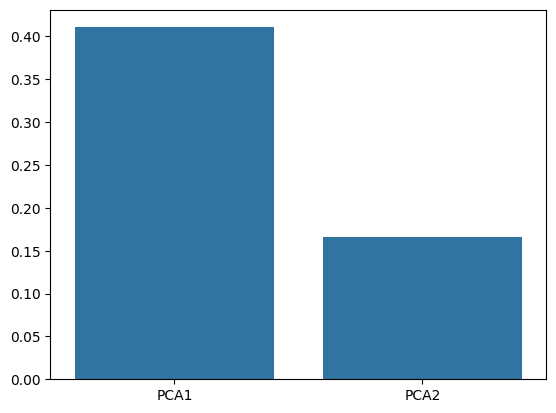

In [ ]:
# Crear grafico
sns.barplot(x = ['PCA1', 'PCA2'], y = pca2.explained_variance_ratio_)

<Axes: xlabel='PCA1', ylabel='PCA2'>

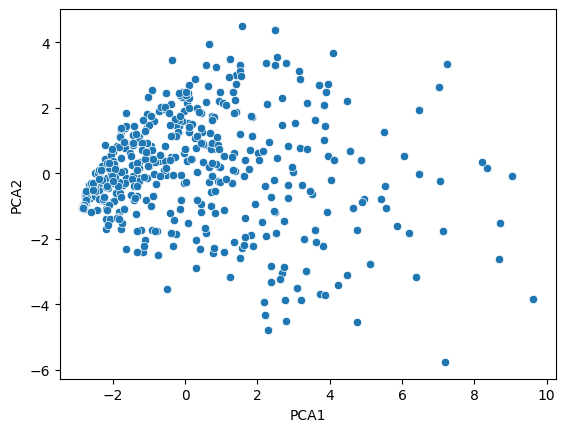

In [ ]:
sns.scatterplot(x = 'PCA1', y = 'PCA2', data = dataframe_2)

In [ ]:
# PCA 3 Componentes
pca3 = PCA(n_components=3, random_state=42)
pca_3 = pca3.fit_transform(datos_df[lista_numeros])
pca_3[:3]

array([[-1.7617516 ,  1.25812318, -1.03038282],
       [ 8.71682399, -1.5338809 , -1.02908492],
       [ 1.41575916,  3.00638623,  0.90648969]])

In [ ]:
dataframe_3 = pd.DataFrame({'PCA1': pca_3[:, 0], 'PCA2': pca_3[:, 1] , 'PCA3': pca_3[:, 2]})
dataframe_3.head()

,PCA1,PCA2,PCA3
0,-1.761752,1.258123,-1.030383
1,8.716824,-1.533881,-1.029085
2,1.415759,3.006386,0.906490
3,7.237494,3.319569,2.182907
4,-0.713084,1.910328,-0.403948


In [ ]:
# Varianza total explicada
pca3.explained_variance_ratio_

array([0.41069814, 0.16638957, 0.08656118])

In [ ]:
# Suma de la varianza
pca3.explained_variance_ratio_.sum()

0.663648891104487

<Axes: >

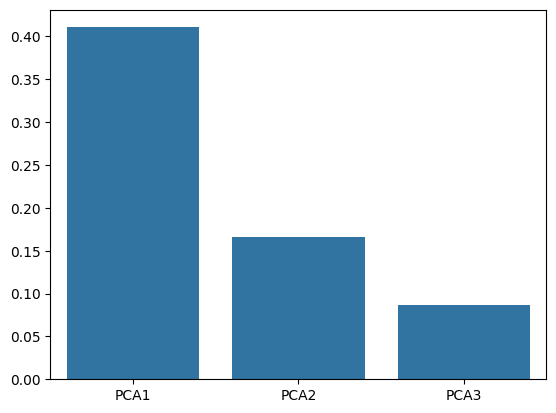

In [ ]:
# Crear grafico
sns.barplot(x = ['PCA1', 'PCA2', 'PCA3'], y = pca3.explained_variance_ratio_)

In [ ]:
# PCA 8 Componentes
pca8 = PCA(n_components=8, random_state=42)
pca_8 = pca8.fit_transform(datos_df[lista_numeros])
pca_8[:3]

array([[-1.7617516 ,  1.25812318, -1.03038282,  0.47928544, -0.90489378,
        -0.23456364, -0.25944529,  0.56251382],
       [ 8.71682399, -1.5338809 , -1.02908492, -2.3807644 , -1.2547383 ,
         4.60917343,  0.48811434,  0.14368272],
       [ 1.41575916,  3.00638623,  0.90648969,  0.5161787 , -1.39572134,
         0.26279727,  0.18051329, -1.85277176]])

In [ ]:
dataframe_8 = pd.DataFrame({'PCA1': pca_8[:, 0], 'PCA2': pca_8[:, 1] , 'PCA3': pca_8[:, 2], 'PCA4': pca_8[:, 3], 'PCA5': pca_8[:, 4], 'PCA6': pca_8[:, 5], 'PCA7': pca_8[:, 6], 'PCA8': pca_8[:, 7]})
dataframe_8

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8
0,-1.761752,1.258123,-1.030383,0.479285,-0.904894,-0.234564,-0.259445,0.562514
1,8.716824,-1.533881,-1.029085,-2.380764,-1.254738,4.609173,0.488114,0.143683
2,1.415759,3.006386,0.906490,0.516179,-1.395721,0.262797,0.180513,-1.852772
3,7.237494,3.319569,2.182907,-0.550974,-0.574264,-0.391242,-0.356724,-1.820142
4,-0.713084,1.910328,-0.403948,-0.617235,-0.533351,-0.307067,0.626705,-1.180470
...,...,...,...,...,...,...,...,...
502,-2.836011,-1.062075,0.690717,-1.442190,0.517377,0.274555,-0.425381,0.100287
503,-2.826934,-0.999439,0.570137,-1.099704,0.314915,0.341193,-0.431779,-0.008573
504,-2.806070,-0.966497,0.551055,-1.102778,0.306640,0.324977,-0.427090,-0.009451
505,-2.833857,-1.035491,0.630636,-1.269849,0.416311,0.308581,-0.429805,0.045872


In [ ]:
dataframe_8.to_excel('dataframe_8_CP.xlsx')

In [ ]:
# Varianza total explicada
pca8.explained_variance_ratio_

array([0.41069814, 0.16638957, 0.08656118, 0.06638587, 0.06354595,
       0.05363772, 0.03965672, 0.03209824])

In [ ]:
# Suma de la varianza
pca8.explained_variance_ratio_.sum()

0.9189733971438905

<Axes: >

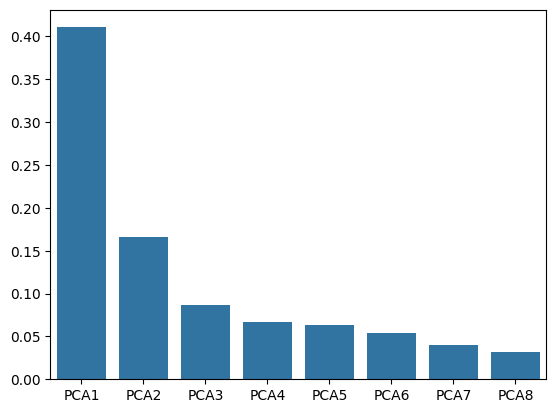

In [ ]:
# Crear grafico
sns.barplot(x = ['PCA1', 'PCA2', 'PCA3', 'PCA4', 'PCA5', 'PCA6', 'PCA7', 'PCA8'], y = pca8.explained_variance_ratio_)